In [20]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, label_binarize
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_recall_curve, PrecisionRecallDisplay, roc_curve, RocCurveDisplay, auc, classification_report
import pickle

In [2]:
# load data
train_ads = pd.read_csv('./train_data_ads.csv.zip', compression='zip')

In [3]:
categorical_features = train_ads.select_dtypes(include=['object', 'category']).columns
numerical_features = train_ads.select_dtypes(include=[np.number]).columns

print(f"Categorical features: {list(categorical_features)}")
print(f"Numerical features: {list(numerical_features)}")
print(train_ads.gender.value_counts())

Categorical features: ['ad_click_list_v001', 'ad_click_list_v002', 'ad_click_list_v003', 'ad_close_list_v001', 'ad_close_list_v002', 'ad_close_list_v003', 'u_newsCatInterestsST']
Numerical features: ['log_id', 'label', 'user_id', 'age', 'gender', 'residence', 'city', 'city_rank', 'series_dev', 'series_group', 'emui_dev', 'device_name', 'device_size', 'net_type', 'task_id', 'adv_id', 'creat_type_cd', 'adv_prim_id', 'inter_type_cd', 'slot_id', 'site_id', 'spread_app_id', 'hispace_app_tags', 'app_second_class', 'app_score', 'pt_d', 'u_refreshTimes', 'u_feedLifeCycle']
gender
2    5946172
4    1178908
3     550437
Name: count, dtype: int64


In [4]:
X = train_ads.drop(['gender'], axis=1)
y = train_ads['gender']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [5]:
from synthcity.utils.serialization import load, load_from_file, save, save_to_file

In [6]:
from synthcity.plugins import Plugins
from synthcity.plugins.core.constraints import Constraints
from synthcity.plugins.core.dataloader import GenericDataLoader
from synthcity.benchmark import Benchmarks
import synthcity.logger as log
import sys

log.add(sink=sys.stderr, level="INFO")
Plugins().list()

[KeOps] Compiling cuda jit compiler engine ... OK
[pyKeOps] Compiling nvrtc binder for python ... OK


[2024-11-24T09:19:43.686990-0800][1073][CRITICAL] module disabled: /u/home/a/alisonki/.conda/envs/stats261/lib/python3.11/site-packages/synthcity/plugins/generic/plugin_goggle.py
[2024-11-24T09:19:43.686990-0800][1073][CRITICAL] module disabled: /u/home/a/alisonki/.conda/envs/stats261/lib/python3.11/site-packages/synthcity/plugins/generic/plugin_goggle.py


['fflows',
 'timevae',
 'dummy_sampler',
 'rtvae',
 'adsgan',
 'survival_gan',
 'image_adsgan',
 'nflow',
 'aim',
 'survae',
 'image_cgan',
 'tvae',
 'marginal_distributions',
 'bayesian_network',
 'ddpm',
 'privbayes',
 'uniform_sampler',
 'dpgan',
 'radialgan',
 'decaf',
 'great',
 'timegan',
 'arf',
 'ctgan',
 'pategan',
 'survival_ctgan',
 'survival_nflow']

In [7]:
cols = ['app_score', 'app_second_class', 'series_group', 'emui_dev', 'series_dev', 'gender'] # sgd important features
data_train = pd.concat([X_train, y_train], axis=1)[cols]

In [8]:
# privbayes
plugin = Plugins().get('privbayes')

[2024-11-24T09:28:02.762920-0800][1073][CRITICAL] module disabled: /u/home/a/alisonki/.conda/envs/stats261/lib/python3.11/site-packages/synthcity/plugins/generic/plugin_goggle.py


Generating synthetic data for gender = 3 and training a model on the real + synthetic data

In [12]:
# train privbayes
synth_data_train = data_train[data_train.gender == 3]
synth_data_cond = y_train[y_train.to_frame().gender == 3]
# synth_data_sample = synth_data_train.sample(frac=0.5, random_state=1)
# synth_data_cond_sample = synth_data_cond.to_frame().sample(frac=0.5, random_state=1)
loader = GenericDataLoader(
    synth_data_train,
    target_column="gender"
)
plugin.fit(loader, cond=synth_data_cond)
# save model
from synthcity.utils.serialization import load, load_from_file, save, save_to_file
plugin_path = './privbayes/privbayes_gender3_frac1_sgd_imp_feats_cond.pkl'
save_to_file(plugin_path, plugin)

100% 5/5 [01:27<00:00, 17.47s/it]


In [13]:
# load plugin from file
from synthcity.utils.serialization import load, load_from_file, save, save_to_file
plugin_path = './privbayes/privbayes_gender3_frac1_sgd_imp_feats_cond.pkl'
plugin = load_from_file(plugin_path)

In [14]:
# generate synthetic data points for gender = 3 
num_points = 165000
syn_data = plugin.generate(num_points).dataframe()
syn_data.head()

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:21:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:21:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:22:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:22:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:22:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:24:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:24:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:27:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:27:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:27:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:27:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:27:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:27:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:27:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:27:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:29:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:29:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:30:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:30:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:32:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:32:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:32:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:35:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:35:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:35:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:35:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:35:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:37:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:37:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:40:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:40:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:40:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:40:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:40:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:40:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:40:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:40:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:43:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:43:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:43:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:43:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:45:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:45:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:46:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:48:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:48:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:48:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:48:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:48:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:48:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:48:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:48:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:51:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:51:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:53:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:53:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:54:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:54:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:54:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:56:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:56:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:56:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:56:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:56:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:42:58:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:42:58:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:42:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:59:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:42:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:42:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:01:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:01:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:01:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:04:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:04:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:06:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:06:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:07:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:07:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:07:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:09:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:09:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:09:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:09:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:09:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:12:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:12:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:14:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:14:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:15:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:15:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:15:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:17:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:17:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:20:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:20:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:20:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:23:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:23:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:23:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:23:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:25:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:25:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:26:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:28:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:28:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:29:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:29:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:29:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:31:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:31:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:34:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:34:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:34:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:34:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:34:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:36:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:36:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:39:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:39:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:40:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:40:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:40:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:40:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:40:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:40:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:42:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:42:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:42:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:42:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:42:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:45:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:45:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:47:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:48:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:48:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:48:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:48:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:48:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:48:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:48:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:50:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:50:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:53:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:53:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:53:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:56:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:56:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:56:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:56:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:56:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:43:58:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:43:58:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:43:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:59:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:43:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:43:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:01:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:01:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:01:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:04:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:04:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:06:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:06:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:07:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:07:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:07:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:09:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:09:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:12:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:12:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:14:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:14:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:15:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:15:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:15:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:17:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:17:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:20:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:20:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:20:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:22:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:22:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:23:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:23:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:25:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:25:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:28:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:28:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:28:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:28:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:28:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:28:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:28:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:28:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:30:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:30:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:33:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:33:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:33:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:35:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:35:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:36:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:36:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:36:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:36:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:36:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:36:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:38:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:38:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:41:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:41:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:41:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:41:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:41:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:43:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:43:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:44:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:46:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:46:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:46:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:49:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:49:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:49:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:49:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:49:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:49:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:49:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:49:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:51:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:51:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:52:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:54:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:54:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:54:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:54:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:54:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:56:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:57:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:44:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:44:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:44:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:44:59:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:44:59:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:00:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:00:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:00:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:00:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:00:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:00:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:02:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:02:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:02:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:04:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:04:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:07:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:07:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:07:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:07:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:07:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:10:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:10:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:12:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:12:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:13:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:15:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:15:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:15:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:15:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:15:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:18:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:18:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:20:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:20:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:21:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:21:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:21:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:21:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:21:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:21:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:23:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:23:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:23:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:23:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:26:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:26:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:26:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:28:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:28:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:29:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:29:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:29:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:31:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:31:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:34:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:34:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:34:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:34:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:34:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:36:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:36:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:39:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:39:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:39:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:40:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:40:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:42:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:42:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:42:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:42:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:42:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:44:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:44:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:47:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:47:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:47:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:47:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:47:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:47:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:47:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:47:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:50:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:50:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:50:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:50:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:53:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:53:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:53:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:55:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:55:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:56:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:56:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:56:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:45:58:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:45:58:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:45:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:45:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:45:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:01:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:01:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:01:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:03:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:03:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:06:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:06:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:06:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:09:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:09:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:09:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:09:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:09:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:11:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:11:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:14:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:14:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:14:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:14:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:14:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:14:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:14:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:14:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:17:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:17:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:19:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:19:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:20:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:22:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:22:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:22:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:22:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:22:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:25:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:25:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:27:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:27:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:28:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:28:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:28:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:28:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:28:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:28:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:30:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:30:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:30:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:30:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:32:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:32:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:33:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:35:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:35:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:35:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:35:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:35:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:38:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:38:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:40:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:40:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:41:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:41:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:41:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:43:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:43:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:43:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:43:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:46:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:46:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:46:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:48:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:48:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:49:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:49:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:49:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:49:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:49:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:49:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:51:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:51:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:54:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:54:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:54:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:54:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:54:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:54:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:56:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:56:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:46:59:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:46:59:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:46:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:59:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:46:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:46:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:02:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:02:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:04:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:04:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:07:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:07:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:07:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:07:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:07:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:10:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:10:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:12:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:12:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:13:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:15:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:15:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:15:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:15:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:15:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:15:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:18:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:18:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:20:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:20:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:21:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:21:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:21:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:21:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:21:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:21:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:23:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:23:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:23:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:23:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:26:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:26:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:26:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:28:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:28:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:29:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:29:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:29:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:29:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:31:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:31:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:34:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:34:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:34:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:34:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:34:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:34:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:36:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:36:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:39:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:39:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:39:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:42:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:42:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:42:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:42:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:42:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:42:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:44:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:44:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:47:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:47:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:47:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:47:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:47:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:47:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:47:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:47:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:50:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:50:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:50:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:50:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:52:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:52:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:53:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:55:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:55:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:56:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:56:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:56:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:47:58:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:47:58:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:47:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:47:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:47:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:01:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:01:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:01:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:01:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:01:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:03:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:03:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:06:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:06:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:06:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:08:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:09:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:09:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:09:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:09:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:09:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:11:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:11:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:14:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:14:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:14:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:14:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:14:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:14:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:14:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:14:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:16:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:17:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:19:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:19:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:19:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:22:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:22:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:22:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:22:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:22:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:22:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:24:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:24:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:27:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:27:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:27:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:27:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:27:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:27:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:27:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:27:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:30:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:30:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:30:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:30:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:32:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:32:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:33:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:35:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:35:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:35:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:35:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:35:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:35:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:38:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:38:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:40:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:40:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:41:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:41:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:41:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:41:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:43:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:43:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:43:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:43:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 09:48:46:WARNING:Probability values don't exactly sum to 1. Differ by: 8.104628079763643e-15. Adjusting values.
11/24/2024 09:48:46:WARNING:Probability values don't exactly sum to 1. Differ by: 8.215650382226158e-15. Adjusting values.
11/24/2024 09:48:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:46:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 09:48:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 09:48:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 

,app_score,app_second_class,series_group,emui_dev,series_dev,gender
0,0.0,23,2,11,27,4
1,10.0,15,6,19,32,4
2,10.0,17,2,11,27,4
3,0.0,23,3,21,30,3
4,10.0,15,2,11,27,4


In [15]:
# write synthetic data to output
syn_data.to_csv('./privbayes/data/privbayes_gender3_frac1_sgd_imp_feats.csv', index=False)

In [84]:
# read in synthetic data
syn_data = pd.read_csv('./privbayes/data/privbayes_gender3_frac1_sgd_imp_feats.csv')

In [43]:
train_ads.shape, syn_data.shape

((7675517, 35), (165000, 6))

In [44]:
# add synthetic data to real training data
data_train_synth = pd.concat([data_train, syn_data])

In [45]:
X_train_synth = data_train_synth.drop(columns='gender')
y_train_synth = data_train_synth['gender']
X_train_synth.shape, y_train_synth.shape

((5537861, 5), (5537861,))

In [47]:
# fit logistic regression on synthetic and real data, adding class 3 samples
lr = LogisticRegression(class_weight='balanced')
pipeline = Pipeline(steps=[
    ('classifier', lr)
])
param_grid = {
    'classifier__penalty': ['l2'],
    'classifier__solver': ['saga'],
    'classifier__C': np.arange(0.1, 1, 0.3),
    'classifier__warm_start': [True],
    'classifier__max_iter': [750]
}
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=5,
    n_jobs=-1,
    verbose=3
)
grid_search.fit(X_train_synth, y_train_synth)
print(f"Best Parameters: {grid_search.best_params_}")
best_model = grid_search.best_estimator_

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best Parameters: {'classifier__C': 0.4, 'classifier__max_iter': 750, 'classifier__penalty': 'l2', 'classifier__solver': 'saga', 'classifier__warm_start': True}
[CV 1/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.542 total time= 1.8min
[CV 4/5] END classifier__C=0.4, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.563 total time= 2.2min
[CV 4/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.563 total time= 2.2min
[CV 1/5] END classifier__C=0.4, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.542 total time= 2.2min
[CV 2/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier_

In [48]:
with open('./privbayes/lr_real_synth_privbayes_gender3_frac1_sgd_imp_feats.pkl', 'wb') as f:
    pickle.dump(grid_search.best_estimator_, f)
with open('./privbayes/lr_real_synth_privbayes_gender3_frac1_sgd_imp_feats.pkl', 'rb') as f:
    best_model = pickle.load(f)

Precision for 2: [0.77491254 0.77491287 0.77491994 ... 0.97553018 1.         1.        ]
Recall for 2: [1.00000000e+00 1.00000000e+00 1.00000000e+00 ... 3.35134729e-04
 2.52191686e-05 0.00000000e+00]
Precision for 3: [0.07176018 0.07176024 0.07176089 ... 0.         0.         1.        ]
Recall for 3: [1. 1. 1. ... 0. 0. 0.]
Precision for 4: [0.15332729 0.1533474  0.15334853 ... 1.         1.         1.        ]
Recall for 4: [1.00000000e+00 1.00000000e+00 1.00000000e+00 ... 6.51447346e-05
 5.66475953e-06 0.00000000e+00]


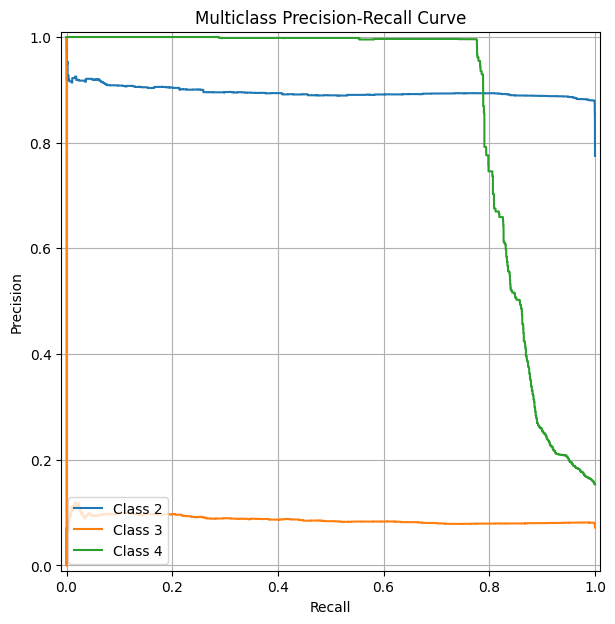

In [49]:
# get metrics
#  Binarize the labels (One-vs-Rest) for precision-recall calculation
y_test_bin = label_binarize(y_test, classes=[2, 3, 4])
features = ['app_score', 'app_second_class', 'series_group', 'emui_dev', 'series_dev'] 

# Step 4: Get predicted probabilities for each class
y_prob = best_model.predict_proba(X_test[features])

# Step 5: Plot Precision-Recall curves for each class
plt.figure(figsize=(10, 7))

for i in range(y_prob.shape[1]):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_prob[:, i])
    print(f'Precision for {i+2}: {precision}')
    print(f'Recall for {i+2}: {recall}')
    display = PrecisionRecallDisplay(precision=precision, recall=recall)
    display.plot(ax=plt.gca(), name=f'Class {i+2}')

# Step 6: Add plot details
plt.title('Multiclass Precision-Recall Curve')
plt.grid(True)
plt.savefig('./privbayes/plots/PRcurve_privbayes_gender3_frac1_sgd_imp_feats_realsynth.pdf', bbox_inches='tight')
plt.show()

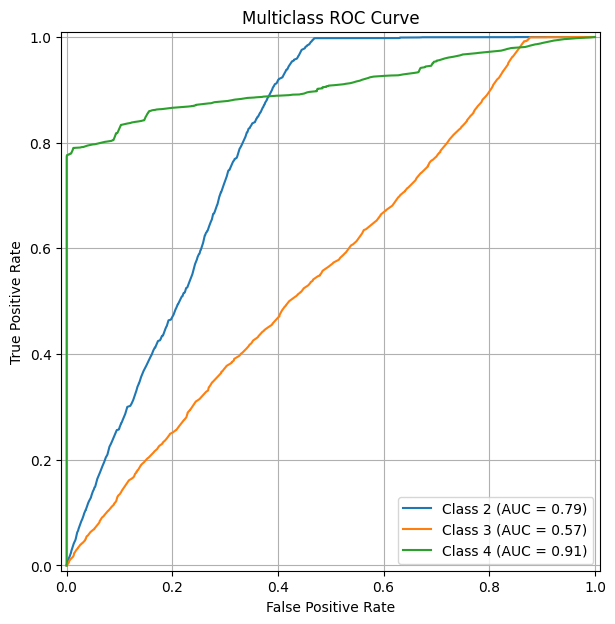

In [81]:
plt.figure(figsize=(10, 7))
for i in range(y_prob.shape[1]):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_prob[:, i])
    roc_auc = auc(fpr, tpr)
    display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=f'Class {i+2}')
    display.plot(ax=plt.gca())

# Step 7: Add plot details
plt.title('Multiclass ROC Curve')
plt.grid(True)
plt.savefig('./privbayes/plots/ROCcurve_privbayes_gender3_frac1_sgd_imp_feats_realsynth.pdf', bbox_inches='tight')
plt.show()

In [51]:
y_pred = best_model.predict(X_test[features])
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           2       0.90      0.52      0.66   1784357
           3       0.09      0.36      0.14    165239
           4       0.51      0.85      0.64    353060

    accuracy                           0.56   2302656
   macro avg       0.50      0.58      0.48   2302656
weighted avg       0.78      0.56      0.62   2302656

[CV 3/5] END classifier__C=0.4, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.552 total time= 2.9min
[CV 2/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.553 total time= 3.0min
[CV 3/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.554 total time= 3.0min
[CV 3/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver

In [ ]:
y_pred = best_model.predict(X_test[features])
plt.figure(figsize=(8, 8))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[2, 3, 4])
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix', fontsize=12)
plt.savefig('./privbayes/plots/Confusion_privbayes_gender3_frac1_sgd_imp_feats_realsynth.pdf', bbox_inches='tight')  # Save as PDF
plt.show()

Training Privbayes on all training data, generating around 20% synthetic points

In [52]:
# train privbayes
loader = GenericDataLoader(
    data_train,
    target_column="gender"
)
plugin.fit(loader, cond=y_train)
# save model
from synthcity.utils.serialization import load, load_from_file, save, save_to_file
plugin_path = './privbayes/privbayes_genderall_frac1_sgd_imp_feats_cond.pkl'
save_to_file(plugin_path, plugin)

100% 5/5 [05:51<00:00, 70.27s/it]


In [53]:
# load plugin from file
from synthcity.utils.serialization import load, load_from_file, save, save_to_file
plugin_path = './privbayes/privbayes_genderall_frac1_sgd_imp_feats_cond.pkl'
plugin = load_from_file(plugin_path)

In [55]:
# generate synthetic data points for 20% size of real training
num_points = int(len(X_train)*0.2)
syn_data = plugin.generate(num_points).dataframe()
syn_data.head()

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:10:49:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:10:49:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:10:50:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:10:50:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:10:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:10:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:10:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:10:50:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:10:56:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:10:56:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:10:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:10:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:10:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:10:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:10:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:10:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:03:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:03:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:10:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:16:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:16:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:11:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:11:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:11:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:11:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:11:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:44:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:12:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:12:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:12:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:12:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:12:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:13:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:13:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:13:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:13:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:13:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

[CV 1/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 4/5] END classifier__C=0.9000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/20

[CV 1/5] END classifier__C=0.5000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 2/5] END classifier__C=0.5000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:02:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/20

[CV 5/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:03:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:03:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.


[CV 3/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 3/5] END classifier__C=0.30000000000000004, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:03:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/20

[CV 4/5] END classifier__C=0.5000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 2/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/20

[CV 2/5] END classifier__C=0.30000000000000004, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 3/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/202

[CV 5/5] END classifier__C=0.30000000000000004, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 2/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 4/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 1/5] END classifier__C=0.30000000000000004, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

[CV 1/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 3/5] END classifier__C=0.5000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:07:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:07:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/202

[CV 4/5] END classifier__C=0.30000000000000004, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 5/5] END classifier__C=0.5000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/20

[CV 4/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 2/5] END classifier__C=0.9000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 4.440892098500626e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:08:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024

[CV 5/5] END classifier__C=0.9000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/20

[CV 1/5] END classifier__C=0.9000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s
[CV 3/5] END classifier__C=0.9000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/20

[CV 5/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=nan total time=   0.0s


11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:32:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:52:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:14:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:14:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:14:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:14:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:14:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:32:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:52:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:15:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:15:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:15:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:15:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:15:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:32:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:52:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:16:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:16:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:16:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:16:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:16:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:32:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:52:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:17:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:17:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:17:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:17:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:17:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:18:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:18:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:18:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:18:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:18:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:44:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:19:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:19:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:19:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:19:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:19:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:44:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:20:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:20:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:20:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:20:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:20:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:44:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:21:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:21:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:21:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:21:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:21:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:03:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:03:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:22:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:22:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:22:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:22:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:22:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:03:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:23:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:23:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:23:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:23:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:23:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:03:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:03:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:17:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:24:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:24:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:24:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:24:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:24:57:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:03:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:03:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:25:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:25:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:25:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:25:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:25:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:03:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:03:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:26:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:26:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:26:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:26:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:26:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:04:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:44:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:50:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:50:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:51:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:27:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:27:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:27:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:27:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:27:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:37:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:44:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:28:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:28:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:28:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:28:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:28:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:29:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:29:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:29:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:29:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:29:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:30:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:30:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:30:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:30:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:32:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:30:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:39:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:30:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:30:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:52:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:30:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:30:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:30:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:30:59:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:30:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:00:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:00:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:00:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:00:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:00:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:00:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:06:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:19:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:20:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:20:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:32:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:33:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:33:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:39:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:52:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:53:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:53:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:31:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:31:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:31:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:31:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:31:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:12:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:13:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:13:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:32:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:46:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:46:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:32:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:32:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:32:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:32:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:32:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:05:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:06:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:06:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:18:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:19:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:19:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:25:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:26:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:26:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:39:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:39:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:45:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:33:58:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:33:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:33:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:33:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:59:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:33:59:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:11:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:12:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:12:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:24:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:25:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:25:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:31:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:32:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:32:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:38:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:38:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:38:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:44:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:45:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:45:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:51:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:51:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:52:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:52:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:34:57:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:34:57:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:34:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:34:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:58:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:34:58:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:35:04:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:35:04:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:35:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:05:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:05:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:35:10:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:35:10:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:35:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:11:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:11:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:35:17:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:35:17:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:35:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:18:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:18:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:35:23:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:35:23:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:35:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:24:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:24:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:35:30:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:35:30:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:35:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:31:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:31:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:35:36:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:35:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:35:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:37:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:37:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

  0%|          | 0/6 [00:00<?, ?it/s]

11/24/2024 11:35:43:WARNING:Probability values don't exactly sum to 1. Differ by: 2.1094237467877974e-15. Adjusting values.
11/24/2024 11:35:43:WARNING:Probability values don't exactly sum to 1. Differ by: 1.9984014443252818e-15. Adjusting values.
11/24/2024 11:35:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/2024 11:35:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:44:WARNING:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
11/24/2024 11:35:44:WARNING:Probability values don't exactly sum to 1. Differ by: -2.220446049250313e-16. Adjusting values.
11/24/20

,app_score,app_second_class,series_group,emui_dev,series_dev,gender
0,10.0,14,6,20,32,2
1,0.0,23,8,36,11,2
2,10.0,18,6,32,32,2
3,10.0,15,8,29,11,2
4,10.0,14,2,11,27,4


In [56]:
# write synthetic data to output
syn_data.to_csv('./privbayes/data/privbayes_genderall_frac1_sgd_imp_feats_20percofreal.csv', index=False)

In [57]:
# read in synthetic data
syn_data = pd.read_csv('./privbayes/data/privbayes_genderall_frac1_sgd_imp_feats_20percofreal.csv')

In [63]:
# fit logistic regression on synthetic data for all genders
X_synth = syn_data.drop(columns='gender')
y_synth = syn_data['gender']
lr_synth = LogisticRegression(class_weight='balanced')
pipeline = Pipeline(steps=[
    ('classifier', lr_synth)
])
param_grid = {
    'classifier__penalty': ['l2'],
    'classifier__solver': ['saga'],
    'classifier__C': np.arange(0.1, 1, 0.2),
    'classifier__warm_start': [False],
    'classifier__max_iter': [1000]
}
grid_search_synth = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=5,
    n_jobs=-1,
    verbose=3
)
grid_search_synth.fit(X_synth, y_synth)
print(f"Best Parameters: {grid_search_synth.best_params_}")
best_model_synth = grid_search_synth.best_estimator_

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best Parameters: {'classifier__C': 0.5000000000000001, 'classifier__max_iter': 1000, 'classifier__penalty': 'l2', 'classifier__solver': 'saga', 'classifier__warm_start': False}
[CV 3/5] END classifier__C=0.5000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.367 total time=  15.3s
[CV 4/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.368 total time=  15.3s
[CV 2/5] END classifier__C=0.9000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.368 total time=  15.1s
[CV 5/5] END classifier__C=0.1, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.368 total time=  15.3s
[CV 3/5] END classifier__C=0.1, classifier__ma

In [64]:
with open('./privbayes/lr_synth_privbayes_genderall_frac1_sgd_imp_feats_20percofreal.pkl', 'wb') as f:
    pickle.dump(grid_search_synth.best_estimator_, f)

Precision for 2: [0.77491254 0.77494282 0.7749435  ... 0.96039604 0.96357616 1.        ]
Recall for 2: [1.00000000e+00 1.00000000e+00 1.00000000e+00 ... 1.63083957e-04
 1.63083957e-04 0.00000000e+00]
Precision for 3: [0.07176018 0.07176024 0.0717603  ... 0.05580866 0.11413613 1.        ]
Recall for 3: [1.00000000e+00 1.00000000e+00 1.00000000e+00 ... 1.18616065e-03
 6.59650567e-04 0.00000000e+00]
Precision for 4: [0.15332729 0.15335382 0.15337394 ... 1.         1.         1.        ]
Recall for 4: [1.00000000e+00 9.99980173e-01 9.99980173e-01 ... 2.83237977e-04
 2.54914179e-04 0.00000000e+00]


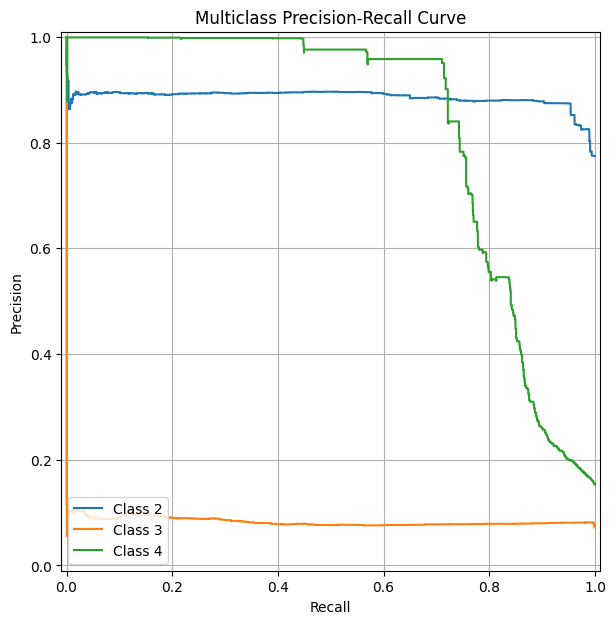

In [66]:
# get metrics
#  Binarize the labels (One-vs-Rest) for precision-recall calculation
y_test_bin = label_binarize(y_test, classes=[2, 3, 4])
features = ['app_score', 'app_second_class', 'series_group', 'emui_dev', 'series_dev'] 

# Step 4: Get predicted probabilities for each class
y_prob = best_model_synth.predict_proba(X_test[features])

# Step 5: Plot Precision-Recall curves for each class
plt.figure(figsize=(10, 7))

for i in range(y_prob.shape[1]):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_prob[:, i])
    print(f'Precision for {i+2}: {precision}')
    print(f'Recall for {i+2}: {recall}')
    display = PrecisionRecallDisplay(precision=precision, recall=recall)
    display.plot(ax=plt.gca(), name=f'Class {i+2}')

# Step 6: Add plot details
plt.title('Multiclass Precision-Recall Curve')
plt.grid(True)
plt.savefig('./privbayes/plots/PRcurve_privbayes_genderall_frac1_sgd_imp_feats_20percofreal_synth.pdf', bbox_inches='tight')
plt.show()

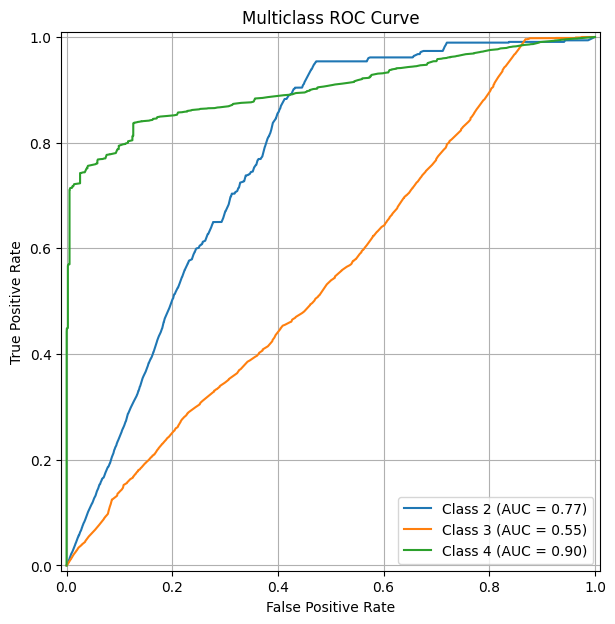

[CV 3/5] END classifier__C=0.7000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.367 total time=  15.0s
[CV 3/5] END classifier__C=0.9000000000000001, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=0.367 total time=  13.4s
[CV 1/5] END classifier__C=0.5000000000000001, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.370 total time=  14.4s
[CV 2/5] END classifier__C=0.7000000000000001, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=0.368 total time=  14.6s
[CV 2/5] END classifier__C=0.30000000000000004, classifier__max_iter=750, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=True;, score=0.368 total time=  15.0s
[CV 2/5] END classifier__C=0.9000000000000001, classifier__max_iter=1000, classi

In [67]:
plt.figure(figsize=(10, 7))
for i in range(y_prob.shape[1]):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_prob[:, i])
    roc_auc = auc(fpr, tpr)
    display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=f'Class {i+2}')
    display.plot(ax=plt.gca())

# Step 7: Add plot details
plt.title('Multiclass ROC Curve')
plt.grid(True)
plt.savefig('./privbayes/plots/ROCcurve_privbayes_genderall_frac1_sgd_imp_feats_20percofreal_synth.pdf', bbox_inches='tight')
plt.show()

In [68]:
y_pred = best_model_synth.predict(X_test[features])
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           2       0.90      0.31      0.46   1784357
           3       0.09      0.21      0.13    165239
           4       0.25      0.90      0.39    353060

    accuracy                           0.40   2302656
   macro avg       0.41      0.48      0.33   2302656
weighted avg       0.74      0.40      0.43   2302656



<Figure size 800x800 with 0 Axes>

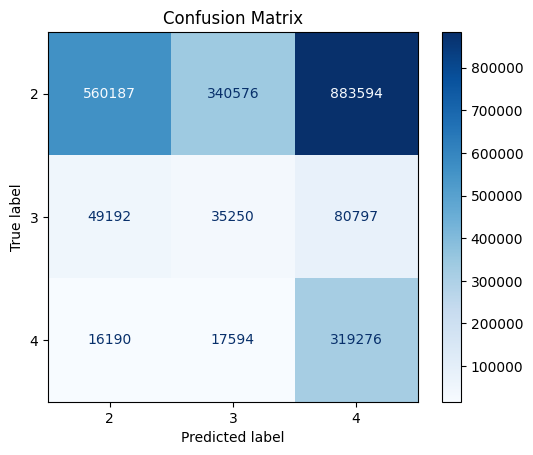

In [82]:
y_pred = best_model_synth.predict(X_test[features])
plt.figure(figsize=(8, 8))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[2, 3, 4])
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix', fontsize=12)
plt.savefig('./privbayes/plots/Confusion_privbayes_genderall_frac1_sgd_imp_feats_20percofreal_synth.pdf', bbox_inches='tight')  # Save as PDF
plt.show()

Combining synthetic data from above and real data

In [71]:
X_real_synth = pd.concat([X_train[features], X_synth])
y_real_synth = pd.concat([y_train, y_synth])

In [72]:
# fit logistic regression on synthetic and real data for all genders
lr_synth_real = LogisticRegression(class_weight='balanced')
pipeline = Pipeline(steps=[
    ('classifier', lr_synth_real)
])
param_grid = {
    'classifier__penalty': ['l2'],
    'classifier__solver': ['saga'],
    'classifier__C': np.arange(0.1, 1, 0.2),
    'classifier__warm_start': [False],
    'classifier__max_iter': [1000]
}
grid_search_synth_real = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=5,
    n_jobs=-1,
    verbose=3
)
grid_search_synth_real.fit(X_real_synth, y_real_synth)
print(f"Best Parameters: {grid_search_synth_real.best_params_}")
best_model_synth_real = grid_search_synth_real.best_estimator_
with open('./privbayes/lr_real_synth_privbayes_genderall_frac1_sgd_imp_feats_20percofreal.pkl', 'wb') as f:
    pickle.dump(grid_search_synth_real.best_estimator_, f)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 5/5] END classifier__C=0.5000000000000001, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=nan total time=  11.2s
[CV 1/5] END classifier__C=0.7000000000000001, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=nan total time=  14.0s
[CV 2/5] END classifier__C=0.7000000000000001, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=nan total time=  12.8s
[CV 3/5] END classifier__C=0.7000000000000001, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=nan total time=  11.3s
[CV 5/5] END classifier__C=0.7000000000000001, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=nan total time=  11.0s
[CV 4/5] END classifier__

In [73]:
y_pred = best_model_synth_real.predict(X_test[features])
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           2       0.90      0.50      0.64   1784357
           3       0.09      0.32      0.14    165239
           4       0.43      0.87      0.58    353060

    accuracy                           0.54   2302656
   macro avg       0.47      0.56      0.45   2302656
weighted avg       0.77      0.54      0.59   2302656

[CV 5/5] END classifier__C=0.1, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=nan total time=  11.3s
[CV 1/5] END classifier__C=0.7000000000000001, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=0.539 total time= 2.1min
[CV 3/5] END classifier__C=0.30000000000000004, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga, classifier__warm_start=False;, score=nan total time=  11.5s
[CV 4/5] END classifier__C=0.7000000000000001, classifier__max_iter=1000, classifi

Precision for 2: [0.77491254 0.77491287 0.77491624 ... 0.97553018 0.97359155 1.        ]
Recall for 2: [1.00000000e+00 1.00000000e+00 1.00000000e+00 ... 3.35134729e-04
 3.09915561e-04 0.00000000e+00]
Precision for 3: [0.07176018 0.07176024 0.07176089 ... 0.         0.         1.        ]
Recall for 3: [1. 1. 1. ... 0. 0. 0.]
Precision for 4: [0.15332729 0.15336121 0.15345652 ... 1.         1.         1.        ]
Recall for 4: [1.00000000e+00 9.99974509e-01 9.99951850e-01 ... 1.16127570e-04
 5.94799751e-05 0.00000000e+00]


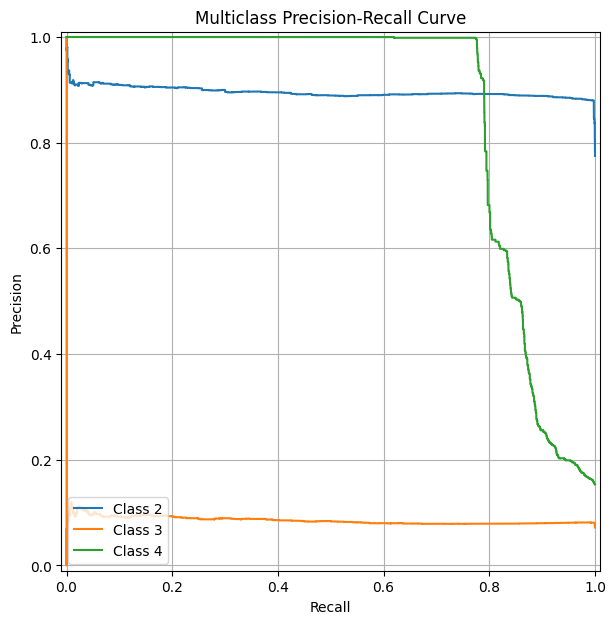

In [75]:
# get metrics
#  Binarize the labels (One-vs-Rest) for precision-recall calculation
y_test_bin = label_binarize(y_test, classes=[2, 3, 4])
features = ['app_score', 'app_second_class', 'series_group', 'emui_dev', 'series_dev'] 

# Step 4: Get predicted probabilities for each class
y_prob = best_model_synth_real.predict_proba(X_test[features])

# Step 5: Plot Precision-Recall curves for each class
plt.figure(figsize=(10, 7))

for i in range(y_prob.shape[1]):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_prob[:, i])
    print(f'Precision for {i+2}: {precision}')
    print(f'Recall for {i+2}: {recall}')
    display = PrecisionRecallDisplay(precision=precision, recall=recall)
    display.plot(ax=plt.gca(), name=f'Class {i+2}')

# Step 6: Add plot details
plt.title('Multiclass Precision-Recall Curve')
plt.grid(True)
plt.savefig('./privbayes/plots/PRcurve_privbayes_genderall_frac1_sgd_imp_feats_20percofreal_real_synth.pdf', bbox_inches='tight')
plt.show()

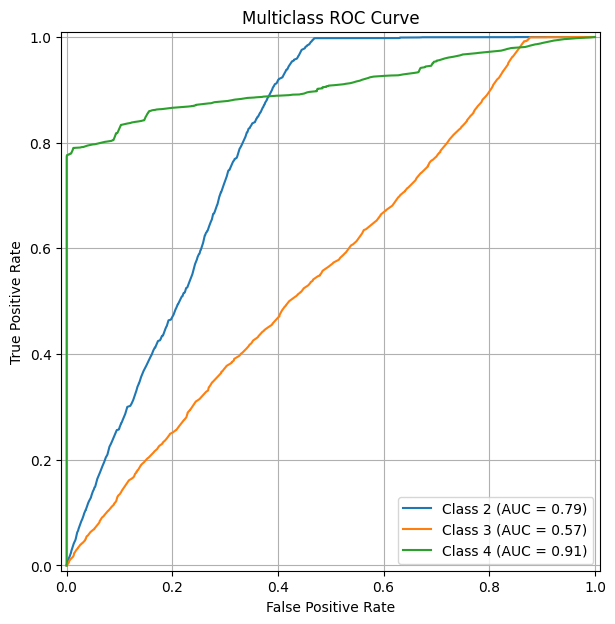

In [76]:
plt.figure(figsize=(10, 7))
for i in range(y_prob.shape[1]):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_prob[:, i])
    roc_auc = auc(fpr, tpr)
    display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=f'Class {i+2}')
    display.plot(ax=plt.gca())

# Step 7: Add plot details
plt.title('Multiclass ROC Curve')
plt.grid(True)
plt.savefig('./privbayes/plots/ROCcurve_privbayes_genderall_frac1_sgd_imp_feats_20percofreal_real_synth.pdf', bbox_inches='tight')
plt.show()

<Figure size 800x800 with 0 Axes>

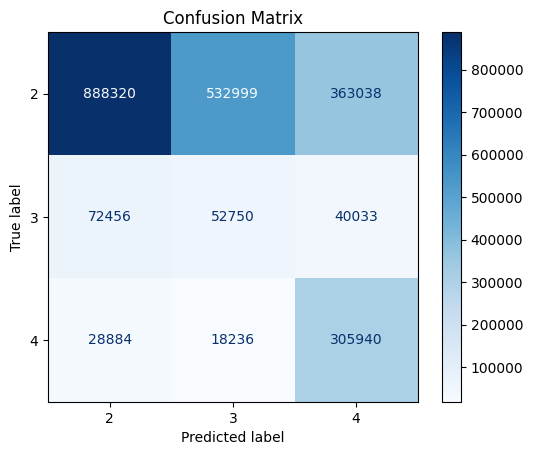

In [83]:
y_pred = best_model_synth_real.predict(X_test[features])
plt.figure(figsize=(8, 8))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[2, 3, 4])
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix', fontsize=12)
plt.savefig('./privbayes/plots/Confusion_privbayes_genderall_frac1_sgd_imp_feats_20percofreal_real_synth.pdf', bbox_inches='tight')  # Save as PDF
plt.show()